#  Tomato vs Cucumber Image Classifier Using OpenCV (No Machine Learning)

Upload an image of a tomato or cucumber


Saving img_001.jpg to img_001 (10).jpg


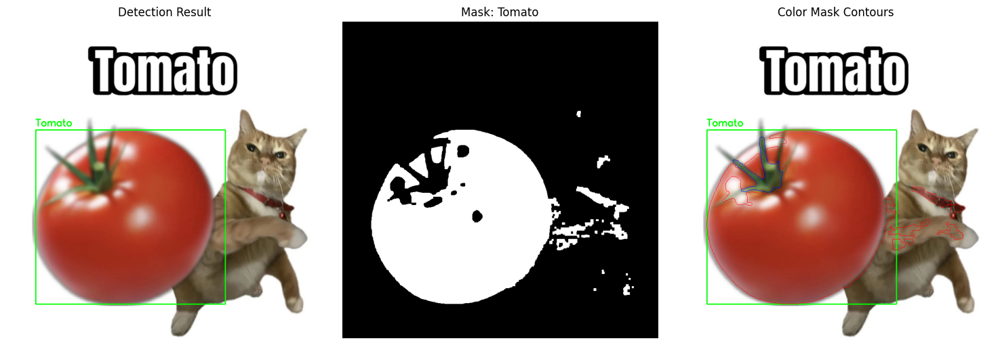

img_001.jpg                    -> Tomato


In [108]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab import files

VEGETABLES_HSV = {
    "Tomato": [
        np.array([0, 60, 60]),
        np.array([15, 255, 255]),
        np.array([165, 60, 60]),
        np.array([180, 255, 255])
    ],
    "Cucumber": [
        np.array([25, 40, 40]),
        np.array([90, 255, 255])
    ]
}

MIN_AREA = 1000
KERNEL = np.ones((5, 5), np.uint8)

def detect_vegetable(image_path):
    img = cv2.imread(image_path)
    if img is None:
        return None

    h, w = img.shape[:2]
    if w > 800:
        new_w = 800
        new_h = int(h * (800 / w))
        img = cv2.resize(img, (new_w, new_h))
    else:
        img = cv2.resize(img, (600, 400))

    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    masks = {}
    areas = {}

    for vegetable, bounds in VEGETABLES_HSV.items():
        if vegetable == "Tomato":
            mask1 = cv2.inRange(hsv, bounds[0], bounds[1])
            mask2 = cv2.inRange(hsv, bounds[2], bounds[3])
            mask = cv2.bitwise_or(mask1, mask2)
        else:
            mask = cv2.inRange(hsv, bounds[0], bounds[1])

        mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, KERNEL)
        mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, KERNEL)
        masks[vegetable] = mask
        areas[vegetable] = cv2.countNonZero(mask)

    detected = None
    max_area = 0
    for veg, area in areas.items():
        if area > max_area and area >= MIN_AREA:
            max_area = area
            detected = veg

    if detected is None:
        return None

    final_mask = masks[detected]
    contours, _ = cv2.findContours(final_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if len(contours) == 0:
        return None

    largest_contour = max(contours, key=cv2.contourArea)
    x, y, w, h = cv2.boundingRect(largest_contour)
    contour_area = cv2.contourArea(largest_contour)
    perimeter = cv2.arcLength(largest_contour, True)
    circularity = 4 * np.pi * contour_area / (perimeter * perimeter + 1e-8)
    aspect_ratio = float(w) / h if h > 0 else 0

    hsv_pixels_in_mask = hsv[final_mask > 0]
    if len(hsv_pixels_in_mask) == 0:
        return None

    mean_hue = np.mean(hsv_pixels_in_mask[:, 0])
    mean_saturation = np.mean(hsv_pixels_in_mask[:, 1])
    mean_value = np.mean(hsv_pixels_in_mask[:, 2])

    is_tomato_valid = False
    is_cucumber_valid = False

    if detected == "Tomato":
        if circularity >= 0.4 and mean_saturation >= 50:
            is_tomato_valid = True
    elif detected == "Cucumber":
        if aspect_ratio >= 1.2 and circularity <= 0.8:
            is_cucumber_valid = True

    if (detected == "Tomato" and not is_tomato_valid) or (detected == "Cucumber" and not is_cucumber_valid):
        if max_area < 20000:
            return None

    cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)
    cv2.putText(img, detected, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2)

    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(15, 5))
    plt.subplot(1, 3, 1)
    plt.imshow(img_rgb)
    plt.title("Detection Result")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(final_mask, cmap='gray')
    plt.title(f"Mask: {detected}")
    plt.axis("off")

    combined_img = img.copy()
    color_map = {"Tomato": (0, 0, 255), "Cucumber": (255, 0, 0)}
    for veg, mask in masks.items():
        cnts, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        for contour in cnts:
            if cv2.contourArea(contour) > MIN_AREA // 2:
                cv2.drawContours(combined_img, [contour], -1, color_map[veg], 1)

    plt.subplot(1, 3, 3)
    plt.imshow(cv2.cvtColor(combined_img, cv2.COLOR_BGR2RGB))
    plt.title("Color Mask Contours")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

    return detected

print("Upload an image of a tomato or cucumber")
uploaded = files.upload()

if not uploaded:
    print("No files were uploaded.")
else:
    results = []
    for filename in uploaded.keys():
        result = detect_vegetable(filename)
        results.append((filename, result if result else "Not Detected"))


    print("=" * 60)
    for fname, veg in results:
        print(f"{fname:<30} -> {veg}")
    print("=" * 60)

## The main stages of development.

### 1.  Importing libraries

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from google.colab import files

### 2. Defining color ranges in HSV

In [ ]:
VEGETABLES_HSV = {
    "Tomato": [
        np.array([0, 60, 60]),
        np.array([15, 255, 255]),
        np.array([165, 60, 60]),
        np.array([180, 255, 255])
    ],
    "Cucumber": [
        np.array([25, 40, 40]),
        np.array([90, 255, 255])
    ]
}

**Why HSV?**

* In the RGB model, the color depends on the brightness of the lighting: the same object in the shade and the sun will have different R, G, B values.

* In HSV (Hue-Saturation-Value):
- Hue (H) — hue (color), almost independent of lighting.
  - Saturation (S) — saturation.
  - Value (V) — brightness.
  
This makes HSV more resistant to changes in lighting.

### 3. Thresholds and filters

In [ ]:
MIN_AREA = 1000
KERNEL = np.ones((5, 5), np.uint8)

**MIN_AREA = 1000 — the minimum area in pixels for the object to be considered "real".** It helps to filter out:

* small glare,

* noises,

* Random spots of color.

**KERNEL = np.ones((5.5)) — a 5×5 core for pixel interactions.**



**Why is the size 5×5?**

  * If the core is too small (1x1 or 3x3), it does not clean well.

  * If it is too large (15x15), it erases not only the garbage, but also the object itself.

  * 5×5 is the golden mean: large enough to remove noise, but does not touch a large object.

### 4. Main function detect_vegetable


* **Image Upload**



```
img = cv2.imread(image_path)
if img is None:
    return None
```



**cv2.imread()** uploads an image in BGR format.

Checking if img is None is protection against broken paths or corrupted files.

* **Image scaling**

In [ ]:
h, w = img.shape[:2]
if w > 800:
    new_w = 800
    new_h = int(h * (800 / w))
    img = cv2.resize(img, (new_w, new_h))
else:
    img = cv2.resize(img, (600, 400))

The pixel width is being checked, if the photo is more than 800 pixels, then we make it smaller while maintaining the proportions.

If the width is less than or equal to 800, then we will still make it the standard size — 600×400.

This is necessary in order to:

* to make it work faster

* to make the algorithm work stably

* to reduce the impact of noise

* **Transfer to HSV**

In [ ]:
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

We translate from BGR → HSV in order to work with a color(H) that is not affected by shadows or bright light.

* **Building masks for each vegetable**

In [ ]:
masks = {}
areas = {}
for vegetable, bounds in VEGETABLES_HSV.items():
    if vegetable == "Tomato":
        mask1 = cv2.inRange(hsv, bounds[0], bounds[1])
        mask2 = cv2.inRange(hsv, bounds[2], bounds[3])
        mask = cv2.bitwise_or(mask1, mask2)
    else:
        mask = cv2.inRange(hsv, bounds[0], bounds[1])

Creating two dictionaries:


 masks — to use masks for analysis later.

areas — to understand which vegetable "takes up more space" in the photo.



For each vegetable from the list VEGETABLES_HSV(Tomato, Cucumber), let's take its color boundaries and find all the pixels whose H, S, V are in the specified range.


* **Morphological filtering**



First we remove the noise, then we fill the holes.

In [ ]:
mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, KERNEL)
mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, KERNEL)

* **Calculating the area of the mask**

In [ ]:
masks[vegetable] = mask
areas[vegetable] = cv2.countNonZero(mask)

* countNonZero(mask) is a function that counts the number of white pixels in the mask.
* The larger the area, the more likely it is that it is a real object.

* **Candidate selection by maximum area**

In [ ]:
detected = None
max_area = 0
for veg, area in areas.items():
    if area > max_area and area >= MIN_AREA:
        max_area = area
        detected = veg

 if detected is None:
        return None

**detected** is a variable that will store the name of the vegetable.

 We check two conditions:

1. Condition: area > max_area

* It is necessary to choose the largest mask.

2. Condition: area >= MIN_AREA

* MIN_AREA = 1000 is the threshold to ignore small noise.


* **Contour Analysis**

In [ ]:
final_mask = masks[detected]
contours, _ = cv2.findContours(final_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
if len(contours) == 0:
    return None
largest_contour = max(contours, key=cv2.contourArea)
x, y, w, h = cv2.boundingRect(largest_contour)

**final_mask = masks[detected]** - we take the mask of the vegetable that we found.

We have already selected a candidate: for example, detected = "Tomato".

Now we take his mask — a black and white image, where white = red pixels.


* **Shape Characteristics**

In [ ]:
contour_area = cv2.contourArea(largest_contour)
perimeter = cv2.arcLength(largest_contour, True)
circularity = 4 * np.pi * contour_area / (perimeter * perimeter + 1e-8)
aspect_ratio = float(w) / h if h > 0 else 0

**contour_area = cv2.contourArea(largest_contour)** — contour area.

 cv2.contourArea is a function that counts how many pixels a vegetable "occupies" inside its contour.

**perimeter = cv2.arcLength(largest_contour, True)** is the length of the vegetable's edge

The cv2.arcLength() function is used to calculate the contour length.

True means that the contour is closed (the beginning and the end are connected).

**circularity = 4 * np.pi * contour_area / (perimeter * perimeter + 1e-8)** is a formula for calculating the roundness of an object. The closer to 1, the rounder.

 contour_area is the area of the object, usually obtained by the cv2.contouarea() function.

perimeter is the length of the contour (perimeter), usually obtained by the cv2.arcLength() function.

np.pi is the number of pi.

1e-8 is a very small number to prevent division by zero.

**aspect_ratio = float(w) / h if h > 0 else 0** - calculates the ratio of the width to the height of the object.

if h > 0 else 0 is a condition that checks that the height is greater than zero to avoid division by zero.

    * If h (height) is greater than zero, then the w/h ratio is calculated.

    * If h is 0 or less, then the value 0 is assigned to avoid the error of division by zero.

* **Color analysis inside the mask**

In [ ]:
hsv_pixels_in_mask = hsv[final_mask > 0]
if len(hsv_pixels_in_mask) == 0:
    return None

mean_hue = np.mean(hsv_pixels_in_mask[:, 0])
mean_saturation = np.mean(hsv_pixels_in_mask[:, 1])
mean_value = np.mean(hsv_pixels_in_mask[:, 2])

**hsv_pixels_in_mask = hsv[final_mask > 0]** - This code extracts pixels from the hsv array that correspond to a specific final_mask mask.

 hsv array

final_mask is a black and white image where the pixels corresponding to the area of interest have values greater than 0, and the rest are 0.

  
final_mask > 0 — creates a Boolean array (logical index), where True for those positions where the mask value is greater than 0.

hsv[final_mask > 0] — selects all pixels from hsv for which the mask is active (where the mask is > 0).

The hsv_pixels_in_mask variable contains only those HSV pixels that are inside the area indicated by the final_mask mask.

**This is a necessary check in case the mask has become empty after morphological filtering (MORPH_OPEN/CLOSE).**

```
if len(hsv_pixels_in_mask) == 0:
    return None
```


**This code calculates the average values of the HSV components (hue, saturation, and brightness) for selected pixels stored in the hsv_pixels_in_mask variable.**
```
mean_hue = np.mean(hsv_pixels_in_mask[:, 0])
mean_saturation = np.mean(hsv_pixels_in_mask[:, 1])
mean_value = np.mean(hsv_pixels_in_mask[:, 2])
```



 **hsv_pixels_in_mask** is an array where each row represents the HSV values of one pixel, and the columns represent the components:

[:, 0] — all values of the hue component (H).

[:, 1] — all values of the saturation component (S).

[:, 2] — all values of the brightness component (V).

Thus, the variables are written:

mean_hue is the average hue (color) among the selected pixels(H).

* **The logic of decision making**

In [ ]:
is_tomato_valid = False
is_cucumber_valid = False

if detected == "Tomato":
    if circularity >= 0.4 and mean_saturation >= 50:
        is_tomato_valid = True
elif detected == "Cucumber":
    if aspect_ratio >= 1.2 and circularity <= 0.8:
        is_cucumber_valid = True

Checking for "Tomato":

    If the object is detected as "Tomato" ,

    and its roundness is not less than 0.4,

    mean_saturation is at least 50,

    then the tomato is considered valid (is_tomato_valid = True).

Checking for "Cucumber":

    If the object is a "Cucumber",

    and its aspect ratio (aspect_ratio) is at least 1.2,

    ircularity is not higher than 0.8,

    then the cucumber is considered valid (is_cucumber_valid = True)


This code filters objects that are considered invalid and have a small area — they are ignored. For objects with a large area, None is returned.

In [ ]:
if (detected == "Tomato" and not is_tomato_valid) or (detected == "Cucumber" and not is_cucumber_valid):
    if max_area < 20000:
        return None

* **Area selection**

In [ ]:
cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)
cv2.putText(img, detected, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(15, 5))

**cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)** - Circles the object with a green rectangle.

**cv2.putText(img, detected, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2)** - displays the name of the detected object just above the rectangle.

**img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)** - Converts an image from BGR format to RGB for correct display with Matplotlib.


* **Visualization of results**

In [ ]:

    plt.subplot(1, 3, 1)
    plt.imshow(img_rgb)
    plt.title("Detection Result")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(final_mask, cmap='gray')
    plt.title(f"Mask: {detected}")
    plt.axis("off")

    combined_img = img.copy()
    color_map = {"Tomato": (0, 0, 255), "Cucumber": (255, 0, 0)}
    for veg, mask in masks.items():
        cnts, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        for contour in cnts:
            if cv2.contourArea(contour) > MIN_AREA // 2:
                cv2.drawContours(combined_img, [contour], -1, color_map[veg], 1)

    plt.subplot(1, 3, 3)
    plt.imshow(cv2.cvtColor(combined_img, cv2.COLOR_BGR2RGB))
    plt.title("Color Mask Contours")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

**Original with frame**

plt.imshow(img_rgb) — shows the original photo, where the green frame and the inscription are already drawn.

**Color mask**


final_mask — mask of the selected vegetable (white = vegetable color, black = background).

**Outlines by color (for comparison)**


```
combined_img = img.copy()
color_map = {"Tomato": (0, 0, 255), "Cucumber": (255, 0, 0)}
```
We create a copy of the original photo so as not to spoil the original.



**Draw the contours of all the vegetables in one image**


```
for veg, mask in masks.items():
    cnts, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    for contour in cnts:
        if cv2.contourArea(contour) > MIN_AREA // 2:
            cv2.drawContours(combined_img, [contour], -1, color_map[veg], 1)
```


**Checks that the contour area (cv2.contouarea function) is more than half of the MIN_AREA value. If the condition is met, the cv2.drawContours function draws the contour on the combined_img image.**

```
if cv2.contourArea(contour) > MIN_AREA // 2:
    cv2.drawContours(combined_img, [contour], -1, color_map[veg], 1)
```

**Returns the string "Tomato" or "Cucumber", or None.**

```
return detected
```

### 5. Recognition result output

In [ ]:
print("Upload an image of a tomato or cucumber")
uploaded = files.upload()

if not uploaded:
    print("No files were uploaded.")
else:
    results = []
     for filename in uploaded.keys():
        result = detect_vegetable(filename)
        results.append((filename, result if result else "Not Detected"))


    print("=" * 60)
    for fname, veg in results:
        print(f"{fname:<30} -> {veg}")
    print("=" * 60)

**Displays a message prompting the user to upload an image.**

```
print("Upload an image of a tomato or cucumber")
uploaded = files.upload()
```



**If the user has not selected the files, it displays a message stating that the files have not been uploaded.**



```
if not uploaded:
    print("No files were uploaded.")
else:
    results = []
```


**If there are files, reports their number, processes and saves the results.**



```
else:
    print(f"Загружено файлов: {len(uploaded)}")
    results = []

    for filename in uploaded.keys():
        result = detect_vegetable(filename)
        results.append((filename, result if result else "Not Detected"))
```


**Displays the dividing line, the file name, and the recognized vegetable.**


```
print("=" * 60)
    for fname, veg in results:
        print(f"{fname:<30} -> {veg}")
    print("=" * 60)
```






## Results & Visual Analysis

During the development and testing of the vegetable recognition system based on color and shape, a comprehensive analysis of various types of images was carried out. The aim was to test the algorithm's resilience to changes in shooting conditions, backgrounds, and composition, as well as to identify its limits of applicability.

###  **1. Ideal conditions (clean object on a homogeneous background)**

     

At this stage, photographs were used where:

   * A tomato or cucumber is located entirely in the frame

   * Background — monochrome, neutral (white, light gray)

   * Lighting — uniform

   * There are no other objects or elements that interfere with recognition

Upload an image of a tomato or cucumber


Saving img_006.jpg to img_006 (3).jpg


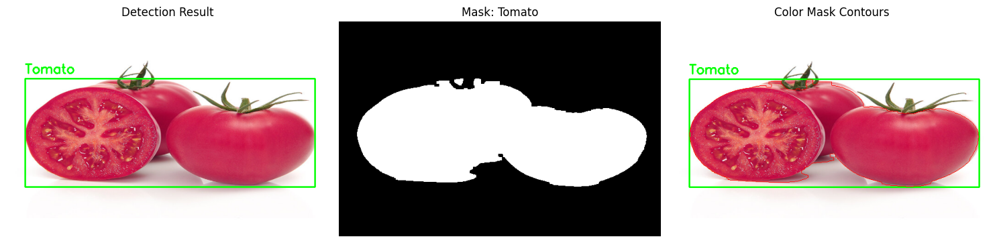

img_006.jpg                    -> Tomato


In [112]:
print("Upload an image of a tomato or cucumber")
uploaded = files.upload()

if not uploaded:
    print("No files were uploaded.")
else:
    results = []
    for filename in uploaded.keys():
        result = detect_vegetable(filename)
        results.append((filename, result if result else "Not Detected"))


    print("=" * 60)
    for fname, veg in results:
        print(f"{fname:<30} -> {veg}")
    print("=" * 60)

Upload an image of a tomato or cucumber


Saving img_008.jpg to img_008 (2).jpg


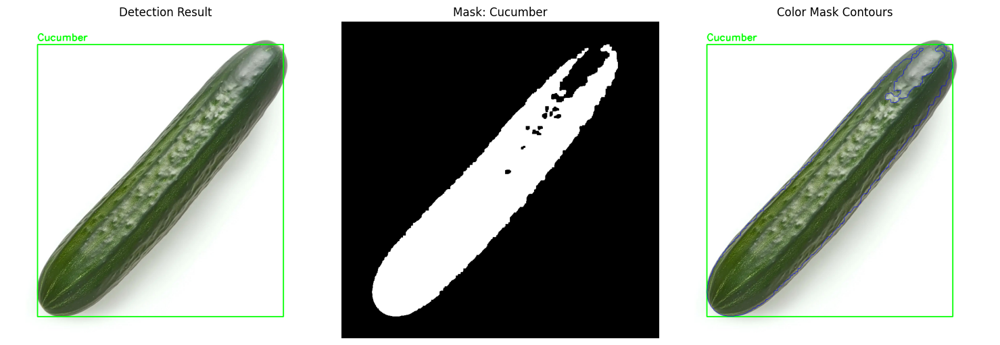

img_008.jpg                    -> Cucumber


In [114]:
print("Upload an image of a tomato or cucumber")
uploaded = files.upload()

if not uploaded:
    print("No files were uploaded.")
else:
    results = []
    for filename in uploaded.keys():
        result = detect_vegetable(filename)
        results.append((filename, result if result else "Not Detected"))


    print("=" * 60)
    for fname, veg in results:
        print(f"{fname:<30} -> {veg}")
    print("=" * 60)

Upload an image of a tomato or cucumber


Saving img_003.jpg to img_003 (3).jpg


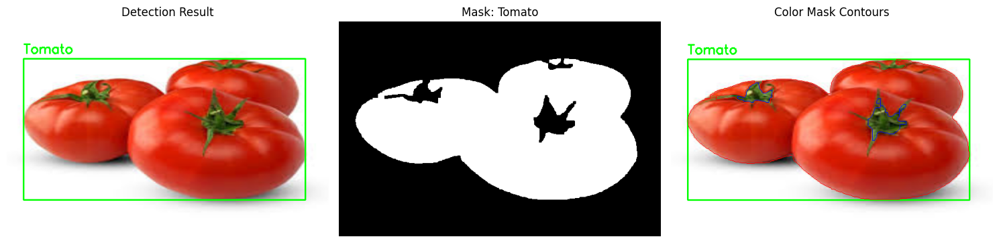

img_003.jpg                    -> Tomato


In [110]:
print("Upload an image of a tomato or cucumber")
uploaded = files.upload()

if not uploaded:
    print("No files were uploaded.")
else:
    results = []
    for filename in uploaded.keys():
        result = detect_vegetable(filename)
        results.append((filename, result if result else "Not Detected"))


    print("=" * 60)
    for fname, veg in results:
        print(f"{fname:<30} -> {veg}")
    print("=" * 60)

Upload an image of a tomato or cucumber


Saving img_010.jpg to img_010 (3).jpg


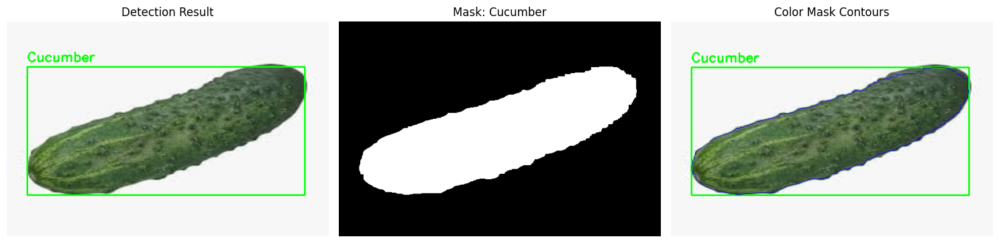

img_010.jpg                    -> Cucumber


In [116]:
print("Upload an image of a tomato or cucumber")
uploaded = files.upload()

if not uploaded:
    print("No files were uploaded.")
else:
    results = []
    for filename in uploaded.keys():
        result = detect_vegetable(filename)
        results.append((filename, result if result else "Not Detected"))


    print("=" * 60)
    for fname, veg in results:
        print(f"{fname:<30} -> {veg}")
    print("=" * 60)

**Results:**

   * The algorithm correctly recognizes all samples

   * The color mask completely covers the object

   * The contour is clear, the shape corresponds to the expected (round for a tomato, elongated for a cucumber)

### **2. Average conditions (an object in the background or several vegetables)**


     

At this stage, the conditions became more complicated:

   * Vegetables may have uncharacteristic textures or be covered in dirt.

   * The vegetable does not have a standard color or has non-standard shapes

  * There are several identical vegetables in the frame

   * Small shadows, reflections, partial overlaps

Upload an image of a tomato or cucumber


Saving img_011.jpg to img_011 (3).jpg


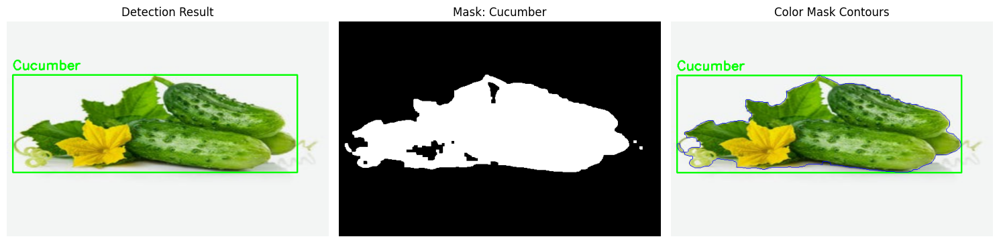

img_011.jpg                    -> Cucumber


In [122]:
print("Upload an image of a tomato or cucumber")
uploaded = files.upload()

if not uploaded:
    print("No files were uploaded.")
else:
    results = []
    for filename in uploaded.keys():
        result = detect_vegetable(filename)
        results.append((filename, result if result else "Not Detected"))


    print("=" * 60)
    for fname, veg in results:
        print(f"{fname:<30} -> {veg}")
    print("=" * 60)

Upload an image of a tomato or cucumber


Saving img_007.jpg to img_007 (3).jpg


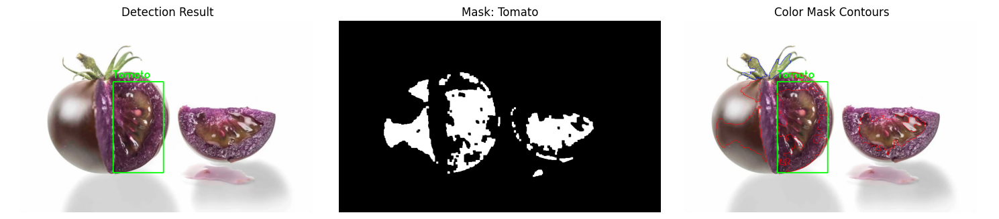

img_007.jpg                    -> Tomato


In [120]:
print("Upload an image of a tomato or cucumber")
uploaded = files.upload()

if not uploaded:
    print("No files were uploaded.")
else:
    results = []
    for filename in uploaded.keys():
        result = detect_vegetable(filename)
        results.append((filename, result if result else "Not Detected"))


    print("=" * 60)
    for fname, veg in results:
        print(f"{fname:<30} -> {veg}")
    print("=" * 60)

Upload an image of a tomato or cucumber


Saving img_018.jpg to img_018 (2).jpg


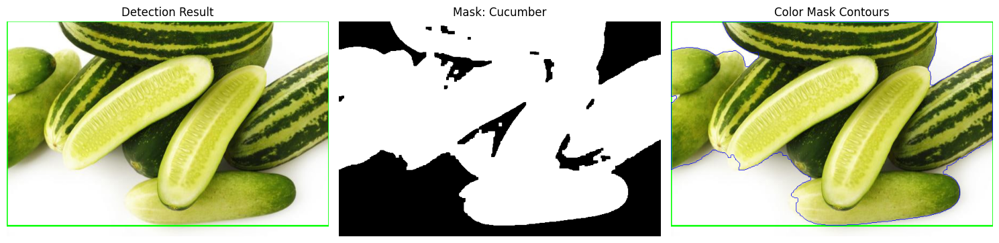

img_018.jpg                    -> Cucumber


In [124]:
print("Upload an image of a tomato or cucumber")
uploaded = files.upload()

if not uploaded:
    print("No files were uploaded.")
else:
    results = []
    for filename in uploaded.keys():
        result = detect_vegetable(filename)
        results.append((filename, result if result else "Not Detected"))


    print("=" * 60)
    for fname, veg in results:
        print(f"{fname:<30} -> {veg}")
    print("=" * 60)

Upload an image of a tomato or cucumber


Saving img_021.jpg to img_021 (2).jpg


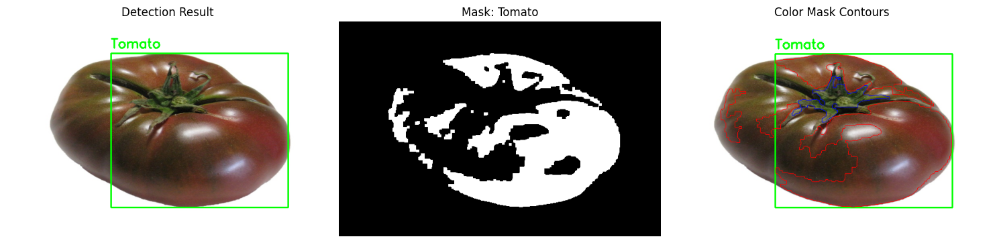

img_021.jpg                    -> Tomato


In [130]:
print("Upload an image of a tomato or cucumber")
uploaded = files.upload()

if not uploaded:
    print("No files were uploaded.")
else:
    results = []
    for filename in uploaded.keys():
        result = detect_vegetable(filename)
        results.append((filename, result if result else "Not Detected"))


    print("=" * 60)
    for fname, veg in results:
        print(f"{fname:<30} -> {veg}")
    print("=" * 60)

Upload an image of a tomato or cucumber


Saving img_019.jpg to img_019 (3).jpg


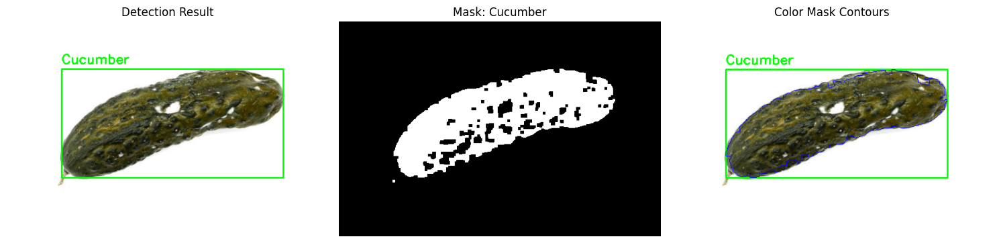

img_019.jpg                    -> Cucumber


In [126]:
print("Upload an image of a tomato or cucumber")
uploaded = files.upload()

if not uploaded:
    print("No files were uploaded.")
else:
    results = []
    for filename in uploaded.keys():
        result = detect_vegetable(filename)
        results.append((filename, result if result else "Not Detected"))


    print("=" * 60)
    for fname, veg in results:
        print(f"{fname:<30} -> {veg}")
    print("=" * 60)

Upload an image of a tomato or cucumber


Saving img_020.jpg to img_020 (3).jpg


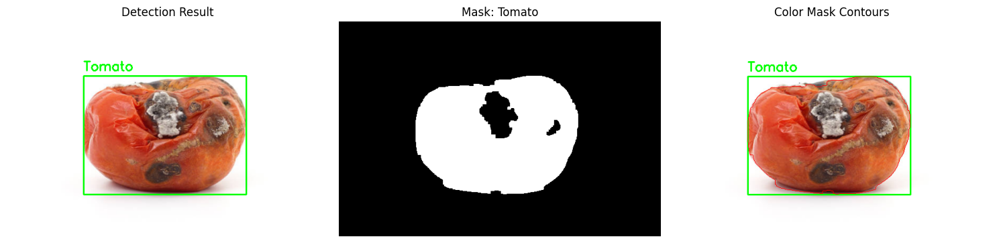

img_020.jpg                    -> Tomato


In [128]:
print("Upload an image of a tomato or cucumber")
uploaded = files.upload()

if not uploaded:
    print("No files were uploaded.")
else:
    results = []
    for filename in uploaded.keys():
        result = detect_vegetable(filename)
        results.append((filename, result if result else "Not Detected"))


    print("=" * 60)
    for fname, veg in results:
        print(f"{fname:<30} -> {veg}")
    print("=" * 60)

**Results:**

  * The algorithm continues to ensure a high degree of recognition accuracy

   * Masks suffer from shadows and non—standard shades - they are perceived as noise.   

  * The algorithm does not recognize the entire object if part of it has a non-standard color.
     


### **3. Difficult conditions (complex background, similar objects, noise)**


     

Extreme cases simulating real-world conditions were tested at this level.:

  * Background with a color similar to the object

   * The presence of foreign objects

   * Vegetables are partially visible, damaged, or irregular in shape

   * Low light, glare, graininess

Upload an image of a tomato or cucumber


Saving img_002.jpg to img_002 (3).jpg


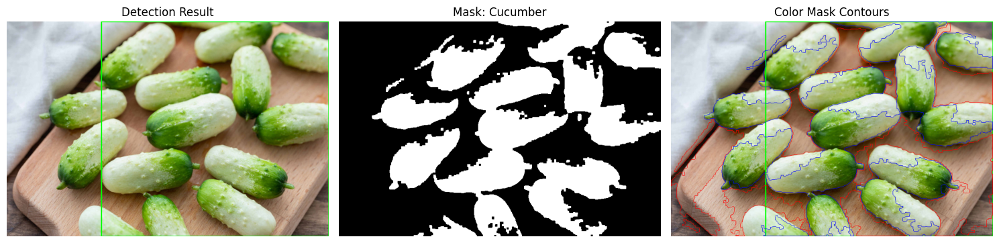

img_002.jpg                    -> Cucumber


In [132]:
print("Upload an image of a tomato or cucumber")
uploaded = files.upload()

if not uploaded:
    print("No files were uploaded.")
else:
    results = []
    for filename in uploaded.keys():
        result = detect_vegetable(filename)
        results.append((filename, result if result else "Not Detected"))


    print("=" * 60)
    for fname, veg in results:
        print(f"{fname:<30} -> {veg}")
    print("=" * 60)

Upload an image of a tomato or cucumber


Saving img_004.jpg to img_004 (2).jpg


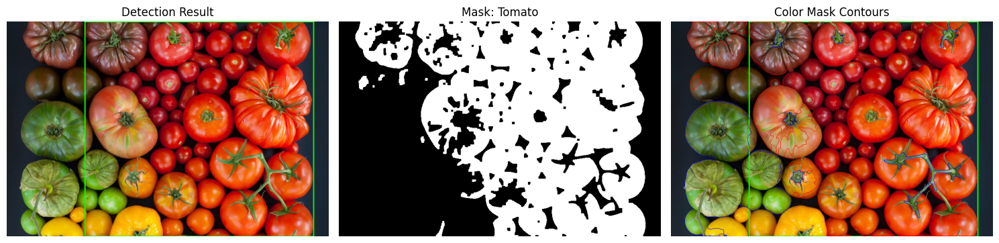

img_004.jpg                    -> Tomato


In [136]:
print("Upload an image of a tomato or cucumber")
uploaded = files.upload()

if not uploaded:
    print("No files were uploaded.")
else:
    results = []
    for filename in uploaded.keys():
        result = detect_vegetable(filename)
        results.append((filename, result if result else "Not Detected"))


    print("=" * 60)
    for fname, veg in results:
        print(f"{fname:<30} -> {veg}")
    print("=" * 60)

Upload an image of a tomato or cucumber


Saving img_009.jpg to img_009 (4).jpg


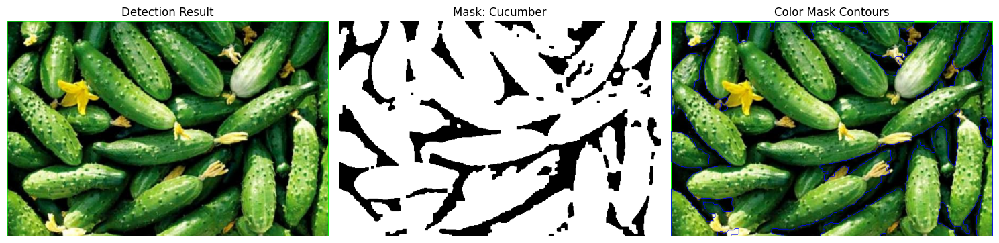

img_009.jpg                    -> Cucumber


In [140]:
print("Upload an image of a tomato or cucumber")
uploaded = files.upload()

if not uploaded:
    print("No files were uploaded.")
else:
    results = []
    for filename in uploaded.keys():
        result = detect_vegetable(filename)
        results.append((filename, result if result else "Not Detected"))


    print("=" * 60)
    for fname, veg in results:
        print(f"{fname:<30} -> {veg}")
    print("=" * 60)

Upload an image of a tomato or cucumber


Saving img_005.jpg to img_005 (2).jpg


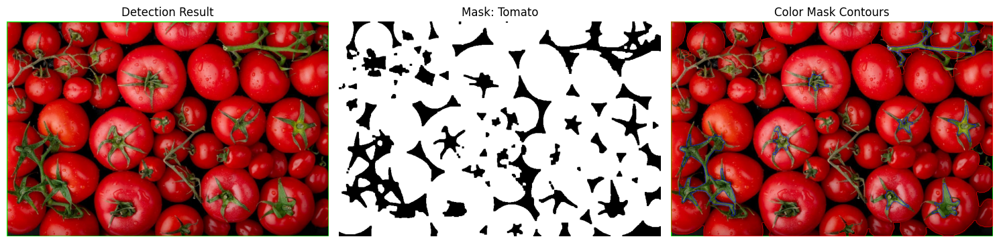

img_005.jpg                    -> Tomato


In [138]:
print("Upload an image of a tomato or cucumber")
uploaded = files.upload()

if not uploaded:
    print("No files were uploaded.")
else:
    results = []
    for filename in uploaded.keys():
        result = detect_vegetable(filename)
        results.append((filename, result if result else "Not Detected"))


    print("=" * 60)
    for fname, veg in results:
        print(f"{fname:<30} -> {veg}")
    print("=" * 60)

Upload an image of a tomato or cucumber


Saving img_013.jpg to img_013 (3).jpg


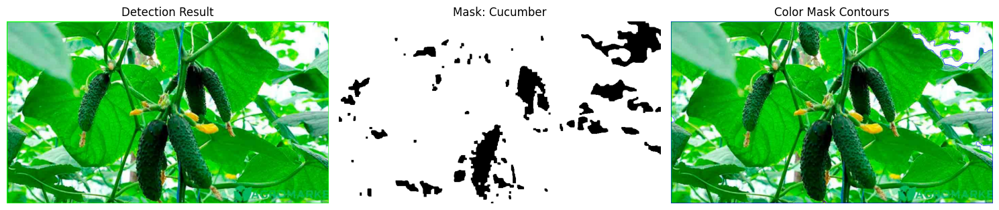

img_013.jpg                    -> Cucumber


In [144]:
print("Upload an image of a tomato or cucumber")
uploaded = files.upload()

if not uploaded:
    print("No files were uploaded.")
else:
    results = []
    for filename in uploaded.keys():
        result = detect_vegetable(filename)
        results.append((filename, result if result else "Not Detected"))


    print("=" * 60)
    for fname, veg in results:
        print(f"{fname:<30} -> {veg}")
    print("=" * 60)

Upload an image of a tomato or cucumber


Saving img_012.jpg to img_012 (2).jpg


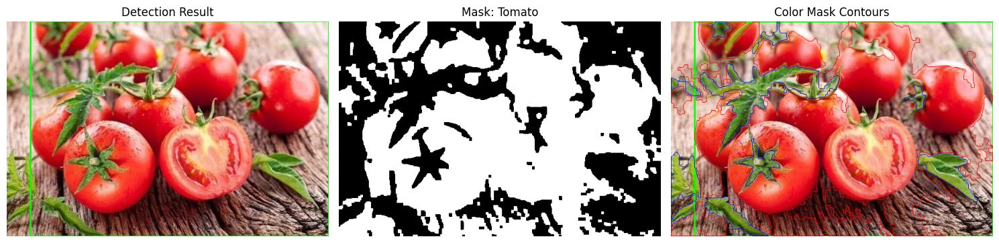

img_012.jpg                    -> Tomato


In [142]:
print("Upload an image of a tomato or cucumber")
uploaded = files.upload()

if not uploaded:
    print("No files were uploaded.")
else:
    results = []
    for filename in uploaded.keys():
        result = detect_vegetable(filename)
        results.append((filename, result if result else "Not Detected"))


    print("=" * 60)
    for fname, veg in results:
        print(f"{fname:<30} -> {veg}")
    print("=" * 60)

Upload an image of a tomato or cucumber


Saving img_015.jpg to img_015 (2).jpg


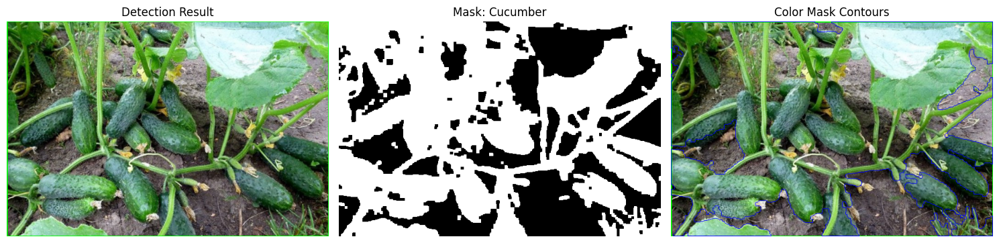

img_015.jpg                    -> Cucumber


In [148]:
print("Upload an image of a tomato or cucumber")
uploaded = files.upload()

if not uploaded:
    print("No files were uploaded.")
else:
    results = []
    for filename in uploaded.keys():
        result = detect_vegetable(filename)
        results.append((filename, result if result else "Not Detected"))


    print("=" * 60)
    for fname, veg in results:
        print(f"{fname:<30} -> {veg}")
    print("=" * 60)

Upload an image of a tomato or cucumber


Saving img_014.jpg to img_014 (2).jpg


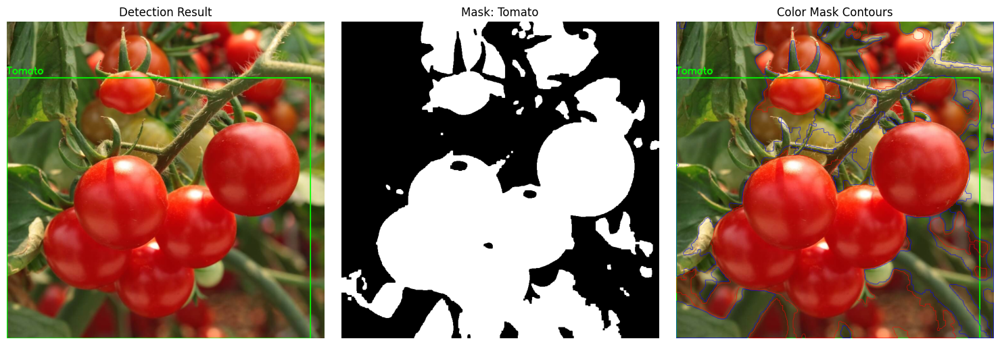

img_014.jpg                    -> Tomato


In [146]:
print("Upload an image of a tomato or cucumber")
uploaded = files.upload()

if not uploaded:
    print("No files were uploaded.")
else:
    results = []
    for filename in uploaded.keys():
        result = detect_vegetable(filename)
        results.append((filename, result if result else "Not Detected"))


    print("=" * 60)
    for fname, veg in results:
        print(f"{fname:<30} -> {veg}")
    print("=" * 60)

Upload an image of a tomato or cucumber


Saving img_016.jpg to img_016 (2).jpg


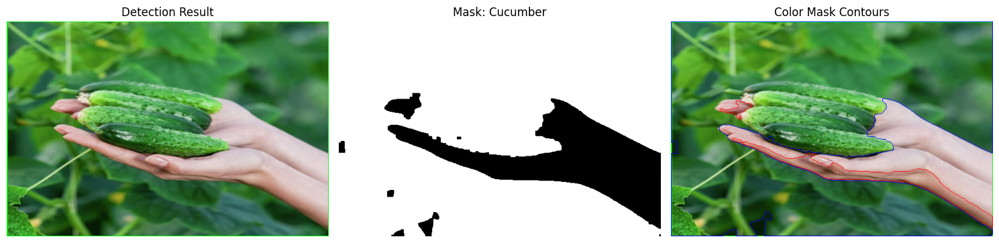

img_016.jpg                    -> Cucumber


In [150]:
print("Upload an image of a tomato or cucumber")
uploaded = files.upload()

if not uploaded:
    print("No files were uploaded.")
else:
    results = []
    for filename in uploaded.keys():
        result = detect_vegetable(filename)
        results.append((filename, result if result else "Not Detected"))


    print("=" * 60)
    for fname, veg in results:
        print(f"{fname:<30} -> {veg}")
    print("=" * 60)

Upload an image of a tomato or cucumber


Saving img_017.jpg to img_017 (2).jpg


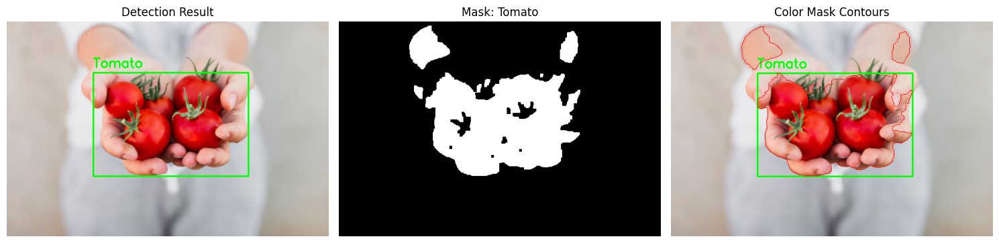

img_017.jpg                    -> Tomato


In [152]:
print("Upload an image of a tomato or cucumber")
uploaded = files.upload()

if not uploaded:
    print("No files were uploaded.")
else:
    results = []
    for filename in uploaded.keys():
        result = detect_vegetable(filename)
        results.append((filename, result if result else "Not Detected"))


    print("=" * 60)
    for fname, veg in results:
        print(f"{fname:<30} -> {veg}")
    print("=" * 60)

Upload an image of a tomato or cucumber


Saving img_023.jpg to img_023 (2).jpg


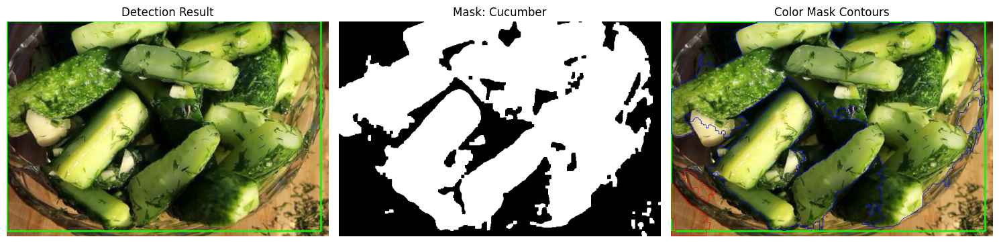

img_023.jpg                    -> Cucumber


In [156]:
print("Upload an image of a tomato or cucumber")
uploaded = files.upload()

if not uploaded:
    print("No files were uploaded.")
else:
    results = []
    for filename in uploaded.keys():
        result = detect_vegetable(filename)
        results.append((filename, result if result else "Not Detected"))


    print("=" * 60)
    for fname, veg in results:
        print(f"{fname:<30} -> {veg}")
    print("=" * 60)

Upload an image of a tomato or cucumber


Saving img_022.jpg to img_022 (2).jpg


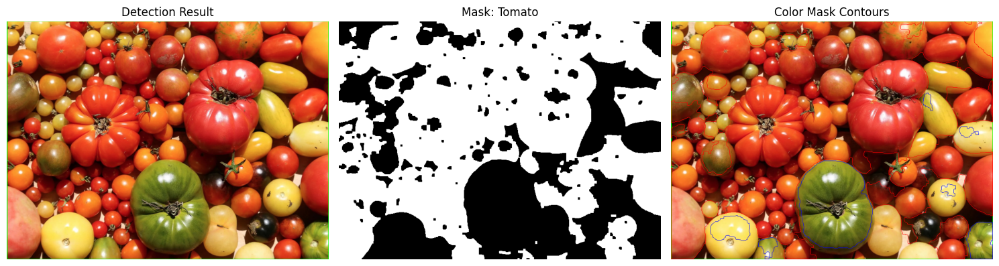

img_022.jpg                    -> Tomato


In [154]:
print("Upload an image of a tomato or cucumber")
uploaded = files.upload()

if not uploaded:
    print("No files were uploaded.")
else:
    results = []
    for filename in uploaded.keys():
        result = detect_vegetable(filename)
        results.append((filename, result if result else "Not Detected"))


    print("=" * 60)
    for fname, veg in results:
        print(f"{fname:<30} -> {veg}")
    print("=" * 60)

Upload an image of a tomato or cucumber


Saving img_024.jpg to img_024 (2).jpg


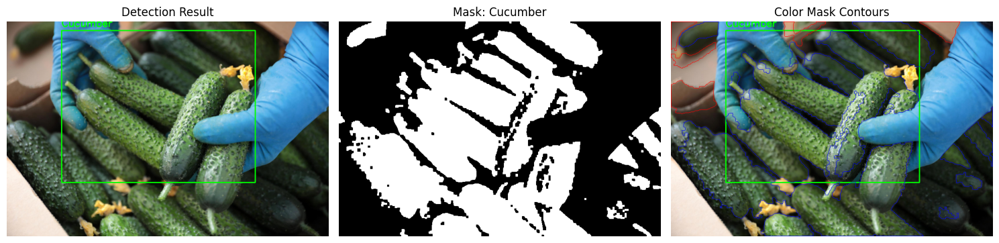

img_024.jpg                    -> Cucumber


In [158]:
print("Upload an image of a tomato or cucumber")
uploaded = files.upload()

if not uploaded:
    print("No files were uploaded.")
else:
    results = []
    for filename in uploaded.keys():
        result = detect_vegetable(filename)
        results.append((filename, result if result else "Not Detected"))


    print("=" * 60)
    for fname, veg in results:
        print(f"{fname:<30} -> {veg}")
    print("=" * 60)

**Results:**

   * The algorithm maintains high classification accuracy by correctly identifying the object.
    
  * The color masks do not reproduce the actual shape of the vegetable — they are fragmented and incomplete. Shadows, glare, uneven hues, and dimly lit areas are ignored, creating "holes" inside the object.

  * The outline drawn using the mask does not match the actual borders of the vegetable.In difficult conditions — when there are several vegetables, leaves, shadows, or non—standard lighting - the contour becomes even more distorted, fragmented, and often misses part of the object.
     

##**Conclusion.**

The developed algorithm, based on the analysis of color ranges in HSV space and geometric characteristics of objects (such as roundness and aspect ratio), has shown high efficiency when working with clean, controlled images. In conditions where the vegetable is represented by a single specimen on a monochrome background with uniform lighting, the color masks accurately reflect the shape of the vegetable, the contours are clear, and the results are reliable.

However, when moving to more complex conditions — the presence of a textured background, several objects in the frame, partial overlap, shadows, and uneven lighting — the effectiveness of the algorithm decreases significantly. In such cases, the system begins to perceive only color patterns, and not the real shapes of objects, which leads to increased errors and reduced recognition accuracy.